# Benchmark

## 1. Environment

In [ ]:
import cafe
import scanpy as sc
import pandas as pd

cafe.settings.backend = "conda"
cafe.logger.setLevel("INFO")

[08/27/2025 04:19:55] INFO                                                                                                                                                                              
                                  _____     _ _ ______    _       ______            _                                                                                                                   
                                 / ____|   | | |  ____|  | |     |  ____|          | |                                                                                                                  
                                | |     ___| | | |__ __ _| |_ ___| |__  __  ___ __ | | ___  _ __ ___ _ __                                                                                               
                                | |    / _ \ | |  __/ _` | __/ _ \  __| \ \/ / '_ \| |/ _ \| '__/ _ \ '__|                                                                                          

## 2. Data

In [2]:
# sample 500 cells from pancreas dataset in scvelo
fadata = cafe.data.read_pancrease(n_obs=500)
fadata

[08/27/2025 04:19:57] DEBUG    sample random cells                                                                                                                                                      
                      DEBUG    Create a FateAnnData object from an existing AnnData object.                                                                                                             
                      DEBUG    FateAnnData add_trajectory                                                                                                                                               


AnnData object with n_obs × n_vars = 500 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    uns: 'cfe'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced', 'expression', 'count'

In [3]:
# fadata.write_h5ad("tmp_input.h5ad")

In [4]:
# cluster_key = "milestone_color"
# fadata.group_onto_nearest_milestones(cluster_key=cluster_key) # new cluster color

# basis = "umap"
# cluster_key_list = ["milestone", cluster_key]
# cafe.plot.plot_graph(fadata, color=cluster_key_list)
# cafe.plot.plot_trajectory(fadata, basis=basis, color=cluster_key_list)


## 3. Method

In [5]:
# choose appropriate start cell
cafe.plot.plot_embedding_plotly(fadata, basis="umap", color="clusters")

In [6]:
# common preprocessing
import scvelo as scv

scv.pp.filter_and_normalize(fadata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(fadata, n_pcs=20, n_neighbors=10)
fadata

[08/27/2025 04:20:01] DEBUG    Create a FateAnnData object from an existing AnnData object.                                                                                                             
                      DEBUG    Create a FateAnnData object from an existing AnnData object.                                                                                                             
                      DEBUG    Create a FateAnnData object from an existing AnnData object.                                                                                                             
[08/27/2025 04:20:02] DEBUG    Create a FateAnnData object from an existing AnnData object.                                                                                                             
Filtered out 24737 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
                      DEBUG    Create a FateAnnData object from an existing AnnData obj

AnnData object with n_obs × n_vars = 500 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'cfe', 'log1p', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced', 'expression', 'count', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

[08/27/2025 04:20:14] DEBUG    CondaBackend __init__                                                                                                                                                    
                      INFO     method_backend: CondaBackend: function_name-cf_comp1, load_backend-cfe                                                                                                   
                      DEBUG    Temp wd: /tmp/tmpffwrhfzq                                                                                                                                                
                      INFO     cmd: conda run -n cfe --no-capture-output /usr/bin/time -v python /home/huang/PyCode/scRNA/CellFateExplorer/CellFateExplorer/cfe/method/function/parse_args.py           
                               --function_name=cf_comp1 --adata_path=/tmp/tmpffwrhfzq/adata.h5ad --prior_information=/tmp/tmpffwrhfzq/prior_information.json                                        

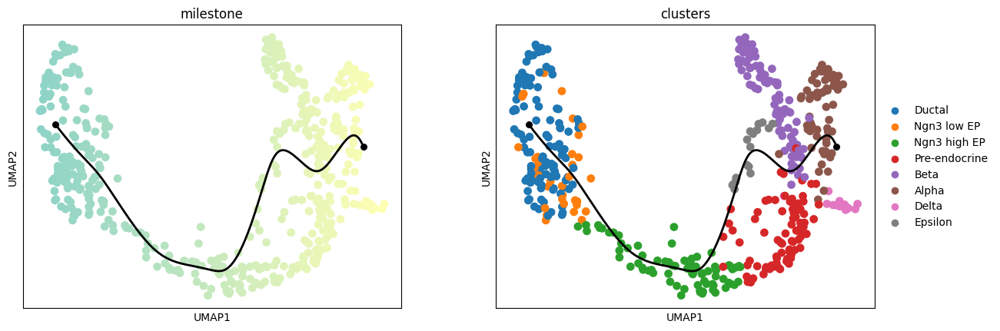

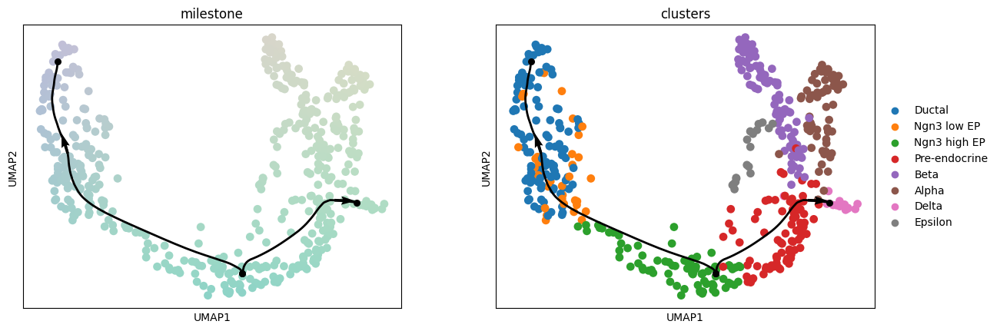

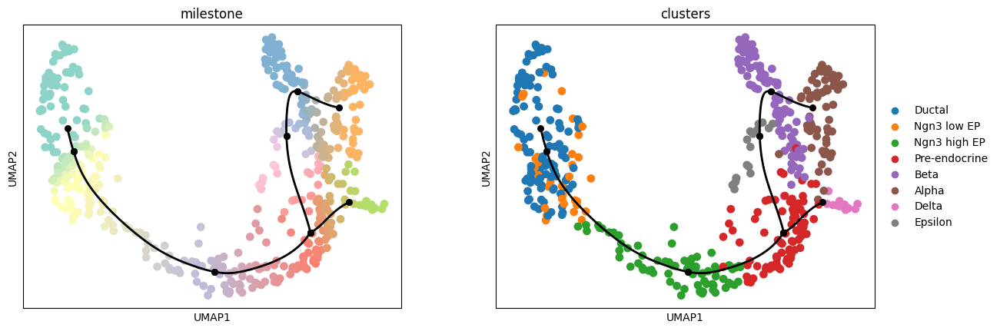

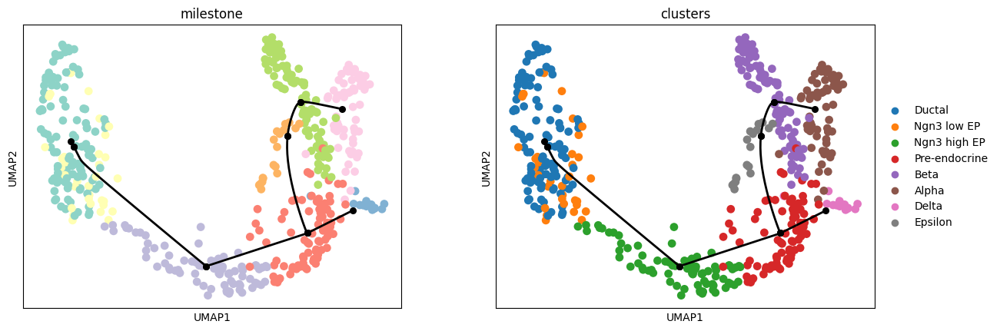

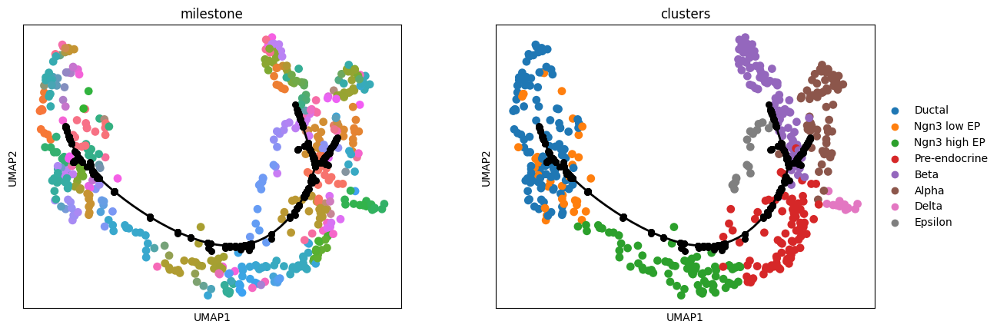

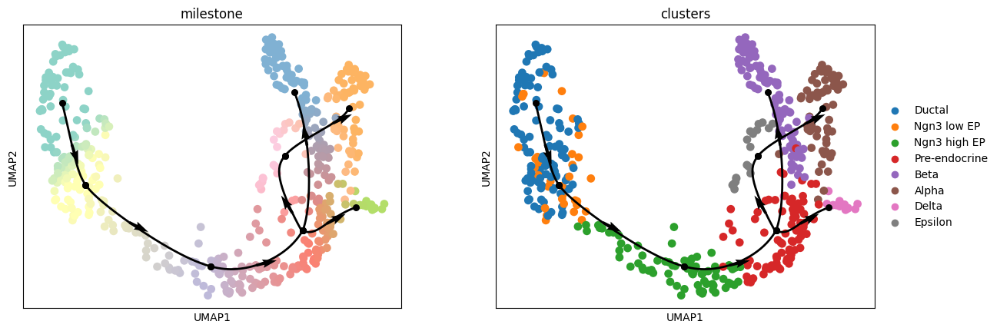

In [7]:

cluster_key = "clusters"
cluster_key_list = ["milestone", cluster_key]

prior_information = {
}
fadata.add_prior_information(**prior_information)  # add prior information to fadata

method2parameters = {
    # "paga": {
    #     "cluster_key": cluster_key,
    #     "connectivity_cutoff": 0.1,
    # },
    "comp1": {
        "basis": "X_umap",
    },
    # "angle" : {
    #     "pca_ndim": 10,
    # },
    "state_comp" : {
        "basis": "X_umap",
        "n_comps": 2, # should letter than basis
    },
    "projection_mst": {
        "basis": "X_umap",
        "recluster": False,
        "cluster_key": cluster_key,
    },
    "cluster_mst": {
        "basis": "X_umap",
        "recluster": False,
        "cluster_key": cluster_key,
    },
    "graph_mst": {
        # test paramter update
        "neighbors_kwargs":{
            "n_pcs": 2,
            "n_neighbors": 5, # more clear graph
            "use_rep": "X_umap",
        }
    },
    "scvelo": {
    },
}

for method_name, parameters in method2parameters.items():
    parameters["repreprocess"] = False
    parameters["benchmark_resource"] = True
    method = cafe.method.FateMethod(method_name=method_name)
    method.infer_trajectory(fadata, parameters=parameters)
    cafe.plot.plot_trajectory(fadata, basis="umap", color=cluster_key_list)

In [8]:
fadata.get_all_resource_usage()

{'ref': {},
 '20250827_162014__comp1-conda__EXfaThSMLU': {'time': 6.31,
  'memory': 662684,
  'cpu': 1.14},
 '20250827_162028__state_comp-conda__GLYLhxYWBn': {'time': 7.52,
  'memory': 665660,
  'cpu': 1.03},
 '20250827_162045__projection_mst-conda__osZeKVL2nV': {'time': 9.16,
  'memory': 680316,
  'cpu': 0.9},
 '20250827_162101__cluster_mst-conda__QmrBP2lvzh': {'time': 8.5,
  'memory': 679760,
  'cpu': 0.96},
 '20250827_162118__graph_mst-conda__Lba1Ar6dcs': {'time': 17.77,
  'memory': 768428,
  'cpu': 1.09},
 '20250827_162159__scvelo-conda__wf8NxMwpTy': {'time': 9.99,
  'memory': 720772,
  'cpu': 0.92}}

Show model name

In [12]:
parsed_model_name_list = fadata.get_all_model_name() # 解析后的模型名称
model_name_list = fadata.get_all_model_name(parse=False)
parsed_model_name_list, model_name_list

[08/27/2025 04:16:12] WARNING  'ref' is not a valid random_time_string, don't need parse                                                                                                                


(['ref', 'comp1-conda', 'state_comp-conda'],
 ['ref',
  '20250827_161529__comp1-conda__7jdrTacPTJ',
  '20250827_161542__state_comp-conda__hNd7M2ZJO8'])

In [13]:
fadata.write_h5ad("test.h5ad")

                      DEBUG    transfer trajectory history: 'ref' to dict                                                                                                                               
                      DEBUG    transfer trajectory history: '20250827_161529__comp1-conda__7jdrTacPTJ' to dict                                                                                          
                      DEBUG    transfer trajectory history: '20250827_161542__state_comp-conda__hNd7M2ZJO8' to dict                                                                                     


## 4. Metric

Available metrics:

In [9]:
cafe.metric.metrics

,metric_id,plotmath,latex,html,long_name,category,type,perfect,worst,symmetric
0,correlation,cor[dist],\mathit{cor}_{\textrm{dist}},cor<sub>dist</sub>,Geodesic distance correlation,cell positions,specific,1,0.0,True
1,rf_mse,MSE[rf],\mathit{MSE}_{\textit{rf}},MSE<sub>rf</sub>,Random Forest MSE,neighbourhood,specific,0,0.3,False
2,rf_nmse,NMSE[rf],\mathit{NMSE}_{\textit{rf}},NMSE<sub>rf</sub>,Random Forest Normalised MSE,neighbourhood,specific,1,0.0,False
3,rf_rsq,R[rf]^2,R^{2}_{rf},R<sup>2</sup><sub>rf</sub>,Random Forest R²,neighbourhood,specific,1,0.0,False
4,lm_nmse,NMSE[lm],\mathit{NMSE}_{\textit{lm}},NMSE<sub>lm</sub>,Linear regression Normalised MSE,neighbourhood,specific,1,0.0,False
5,lm_mse,MSE[lm],\mathit{MSE}_{\textit{lm}},MSE<sub>lm</sub>,Linear regression MSE,neighbourhood,specific,0,0.3,False
6,lm_rsq,R[lm]^2,R^{2}_{lm},R<sup>2</sup><sub>lm</sub>,Linear regression R²,neighbourhood,specific,1,0.0,False
7,edge_flip,edgeflip,\textrm{edgeflip},edgeflip,Edge flip,topology,specific,1,0.0,True
8,him,HIM,\textrm{HIM},HIM,Hamming-Ipsen-Mikhailov similarity,topology,specific,1,0.0,True
9,isomorphic,isomorphic,\textrm{isomorphic},Isomorphic,isomorphic,topology,specific,1,0.0,True


Methods are chosen to be calculated

In [10]:
implemented = [
    "correlation",
    "rf_mse", "rf_rsq", "rf_nmse",
    "lm_mse", "lm_rsq", "lm_nmse",
    "edge_flip", "him",
    # feature importance need to be fixed
    # "featureimp_cor", "featureimp_wcor",
    # "featureimp_ks", "featureimp_wilcox",
    "F1_branches", "F1_milestones"
]
implemented

['correlation',
 'rf_mse',
 'rf_rsq',
 'rf_nmse',
 'lm_mse',
 'lm_rsq',
 'lm_nmse',
 'edge_flip',
 'him',
 'F1_branches',
 'F1_milestones']

Metric calculation

In [11]:
models = list(fadata.uns["cfe"]["trajectory_history_dict"].keys())
# 4. 确保每个模型都有 waypoint_wrapper
for m in set(models) | {"ref"}:
    fadata.model_name = m
    if not fadata.is_wrapped_with_waypoints:
        fadata.add_waypoints()
# 4. 针对每个方法，调用 calculate_metrics 并收集结果
records = {}
for model in models:
    if model == "angle":
        continue
    # 跳过参考自身（ref vs ref）若不想算，可以加 if model=="ref": continue
    print(f"Calculating metrics for model: {model}")
    res = cafe.metric.calculate_metrics(
        fadata,
        now_model=model,
        ref_model="ref",
        simplify=False,  # 是否简化结果
        metrics=implemented
    )
    # 把可能缺失的指标填成 NaN
    for m in implemented:
        res.setdefault(m, float("nan"))
    records[model] = res

# 5. 构造成 DataFrame
df = pd.DataFrame.from_dict(records, orient="index", columns=implemented)

# 6. （可选）把行索引改成更可读的名字，或保存到文件
df.index.name = "method"
df

Calculating metrics for model: ref


ValueError: Both models must have waypoint_wrapper; did you call add_waypoints() for 'ref' and 'ref'?